<a href="https://colab.research.google.com/github/tldrafael/ManipulateFacialAttributesUsingVAE/blob/main/Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Set up environment

In [ ]:
!git clone https://github.com/tldrafael/ManipulateFacialAttributesUsingVAE.git

Cloning into 'ManipulateFacialAttributesUsingVAE'...
remote: Enumerating objects: 317, done.
remote: Counting objects: 100% (317/317), done.
remote: Compressing objects: 100% (228/228), done.
remote: Total 317 (delta 105), reused 275 (delta 67), pack-reused 0
Receiving objects: 100% (317/317), 156.94 MiB | 29.10 MiB/s, done.
Resolving deltas: 100% (105/105), done.
Checking out files: 100% (113/113), done.


In [ ]:
import os
import sys
sys.path.append('ManipulateFacialAttributesUsingVAE')

import numpy as np
from skimage import io
import matplotlib.pyplot as plt
from glob import iglob
from importlib import reload
import tensorflow as tf
import gc

import training as tr
import testing as tst
import utils as ut
import add_attributes as aat
import create_attributevectors as cat
import convert_model_toprediction as cmp

In [ ]:
modelpath_training = '/content/ManipulateFacialAttributesUsingVAE/traindir/pretrained/checkpoints/weights.235-1.23-1.30-1.12-0.07-0.10-0.00.h5'
!cd ManipulateFacialAttributesUsingVAE && python convert_model_toprediction.py $modelpath_training

2021-06-03 15:11:01.037621: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-03 15:11:03.013088: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-03 15:11:03.078277: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-03 15:11:03.079280: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-16GB computeCapability: 6.0
coreClock: 1.3285GHz coreCount: 56 deviceMemorySize: 15.90GiB deviceMemoryBandwidth: 681.88GiB/s
2021-06-03 15:11:03.079324: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-03 15:11:03.160415: I tensorflow/stream_executor/pl

# Load test model

In [ ]:
modelpath = modelpath_training.replace('.h5', '.predict.h5')
vae = tst.VAE2predict()
vae.load_weights(modelpath)

# Plot model reconstruction

In [ ]:
n_samples = 5
sample_paths = list(iglob('/content/ManipulateFacialAttributesUsingVAE/cache/samples/*.jpg'))
sample_paths = sample_paths[:n_samples]
# sample_paths = np.random.choice(sample_paths, n_samples, replace=False)

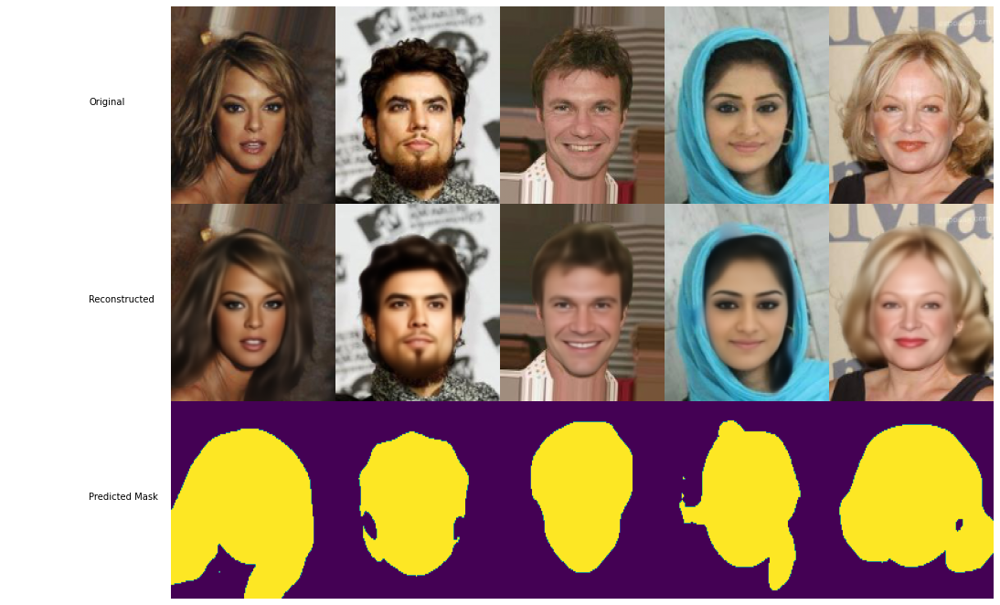

In [ ]:
X_samples = np.stack(list(map(ut.load_img, sample_paths))) / 255

X_preds = vae.predict(X_samples)

fig, axs = plt.subplots(3, n_samples + 1, figsize=(n_samples * 3, 3 * 3))
[a.set_axis_off() for ax in axs for a in ax]
plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)


for i, t in enumerate(['Original', 'Reconstructed', 'Predicted Mask']):
  axs[i, 0].text(x=.5, y=.5, text=t, s=10)


for j in range(n_samples):
  axs[0, j + 1].imshow(X_samples[j], aspect='auto')
  axs[1, j + 1].imshow(X_preds[0][j], aspect='auto')
  axs[2, j + 1].imshow(X_preds[1][j, ..., 0].round(), aspect='auto')

# Generating Spectrum

In [ ]:
vae_add = aat.VAE2AddAttr()
vae_add.load_weights(modelpath)

In [ ]:
# Check it out the already computed attributes
ut.vec_attrs_path.keys()

dict_keys(['Bald', 'Black_Hair', 'Eyeglasses', 'Heavy_Makeup', 'Pale_Skin', 'Smiling', 'Young', 'Bangs', 'Blond_Hair', 'Gray_Hair', 'Mustache', 'Pointy_Nose', 'Wearing_Hat'])

In [ ]:
# Adjust the filepath to absolute path
for k, v in ut.vec_attrs_path.items():
  ut.vec_attrs_path[k] = os.path.join('/content/ManipulateFacialAttributesUsingVAE/cache/vector_attrs', os.path.basename(v))
  
# Load the attribute vectors
vec_attrs = {}
for k, v in ut.vec_attrs_path.items():
  try:
    vec_attrs[k] = np.load(ut.vec_attrs_path[k])
  except:
    continue

vec_attrs.keys()

dict_keys(['Bald', 'Black_Hair', 'Eyeglasses', 'Heavy_Makeup', 'Smiling', 'Young', 'Blond_Hair', 'Gray_Hair', 'Mustache'])

## Visualizing attribute in multiple samples

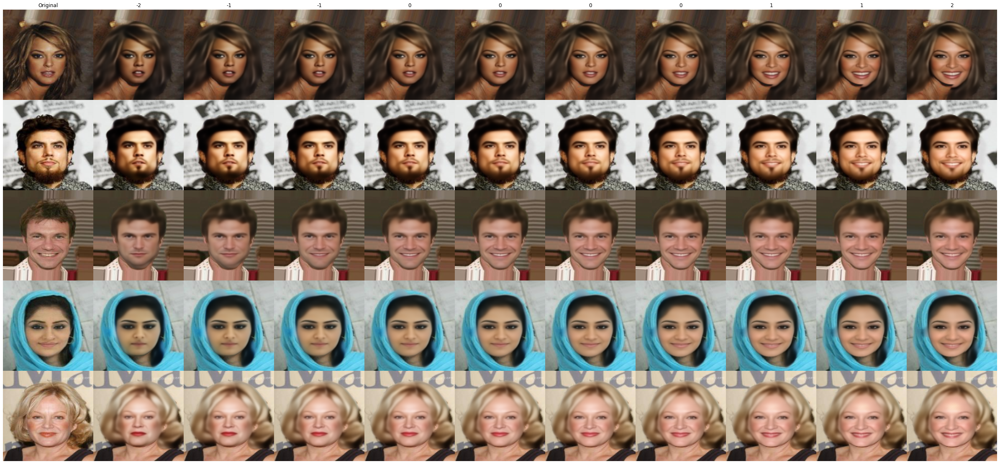

In [ ]:
preds = []
for x_s in X_samples:
  X_pred, attr_factor = vae_add.predict_spectrum(x_s[None], vec_attrs['Smiling'][None], boundaries=(-2, 2), nsamples=10)
  preds.append(X_pred)


ncol = len(X_pred) + 1
nrow = len(preds)
fig, axs = plt.subplots(nrow, ncol, figsize=(3 * ncol, nrow * 3))
plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
[a.set_axis_off() for ax in axs for a in ax]

for i, X_pred in enumerate(preds):
  axs[i, 0].imshow(X_samples[i])
  if i == 0:
    axs[i, 0].set_title('Original')
  
  for a, p, f in zip(axs[i, 1:], X_pred, attr_factor):
      a.imshow(p[0])
      if i == 0:
        a.set_title(int(f))

## Visualizing multiple attribute in the same samples

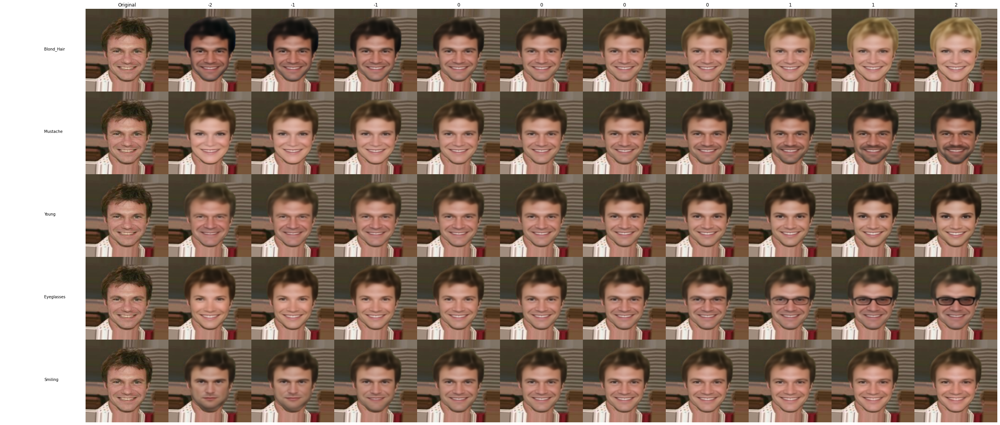

In [ ]:
sample_attrs = ['Blond_Hair', 'Mustache', 'Young', 'Eyeglasses', 'Smiling']

xs = X_samples[2]
preds = []
for i, at in enumerate(sample_attrs):
  X_pred, attr_factor = vae_add.predict_spectrum(xs[None], vec_attrs[at][None], boundaries=(-2, 2), nsamples=10)
  preds.append(X_pred)
  
  
ncol = len(X_pred) + 2
nrow = len(preds)
fig, axs = plt.subplots(nrow, ncol, figsize=(3 * ncol, nrow * 3))
plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
[a.set_axis_off() for ax in axs for a in ax]

for i, X_pred in enumerate(preds):
  axs[i, 0].text(x=.5, y=.5, s=10, text=sample_attrs[i])
  axs[i, 1].imshow(xs)
  if i == 0:
    axs[i, 1].set_title('Original')
  
  for a, p, f in zip(axs[i, 2:], X_pred, attr_factor):
      a.imshow(p[0])
      if i == 0:
        a.set_title(int(f))

As these are the generic vector attributes that include both sex, we some correlation between attributes and sex. To enhance this edition we can get vector attributes by sex, as shown in [Custom attributes session](#custom-attributes) later.

# Creating attributes vectors

## Download the celebA dataset

In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# Download attribute list
file_id = '0B7EVK8r0v71pblRyaVFSWGxPY0U'
downloaded = drive.CreateFile({'id':file_id})
downloaded.FetchMetadata(fetch_all=True)
downloaded.GetContentFile(downloaded.metadata['title'])

# Download partition file
file_id = '0B7EVK8r0v71pY0NSMzRuSXJEVkk'
downloaded = drive.CreateFile({'id':file_id})
downloaded.FetchMetadata(fetch_all=True)
downloaded.GetContentFile(downloaded.metadata['title'])

# Download image zip
file_id = '0B7EVK8r0v71pZjFTYXZWM3FlRnM'
downloaded = drive.CreateFile({'id':file_id})
downloaded.FetchMetadata(fetch_all=True)
downloaded.GetContentFile(downloaded.metadata['title'])

In [ ]:
!unzip img_align_celeba.zip
!mv img_align_celeba imgs
!mkdir img_align_celeba
!mv imgs/ list_eval_partition.txt list_attr_celeba.txt img_align_celeba/

Streaming output truncated to the last 5000 lines.
 extracting: img_align_celeba/197600.jpg  
 extracting: img_align_celeba/197601.jpg  
 extracting: img_align_celeba/197602.jpg  
 extracting: img_align_celeba/197603.jpg  
 extracting: img_align_celeba/197604.jpg  
 extracting: img_align_celeba/197605.jpg  
 extracting: img_align_celeba/197606.jpg  
 extracting: img_align_celeba/197607.jpg  
 extracting: img_align_celeba/197608.jpg  
 extracting: img_align_celeba/197609.jpg  
 extracting: img_align_celeba/197610.jpg  
 extracting: img_align_celeba/197611.jpg  
 extracting: img_align_celeba/197612.jpg  
 extracting: img_align_celeba/197613.jpg  
 extracting: img_align_celeba/197614.jpg  
 extracting: img_align_celeba/197615.jpg  
 extracting: img_align_celeba/197616.jpg  
 extracting: img_align_celeba/197617.jpg  
 extracting: img_align_celeba/197618.jpg  
 extracting: img_align_celeba/197619.jpg  
 extracting: img_align_celeba/197620.jpg  
 extracting: img_align_celeba/197621.jpg  
 ex

## Estimate attribute vectors 

(Use GPU set up here)



In [ ]:
os.environ['celeba'] = '/content/img_align_celeba'

df_celeba = cat.load_celeba()
# Use only the training samples to estimate the attribute vectors
bnames_train = cat.load_train_bnames()

Take care to now crash the current session. Colab seems to release the memory from the accumulated processes only after it ends the entire Cell processing.

In [ ]:
if not os.path.exists('vec_attrs'):
  os.makedirs('vec_attrs')

attrs2create = ['Blond_Hair', 'Gray_Hair', 'Black_Hair', 'Young', 'Eyeglasses', 'Smiling',
                'No_Beard', 'Bald', 'Heavy_Makeup', 'Mustache', 'Narrow_Eyes']
for attr in attrs2create:
  outfile = os.path.join('vec_attrs/', '{}.npy'.format(attr))
  if os.path.exists(outfile):
    print(attr)
    continue
  vec_attr = cat.create_attribute_vector(modelpath_training, df_celeba, attr, bnames_train, nsamples=5000, loadsize_factor=1)
  np.save(outfile, vec_attr)

## Custom attributes

In [ ]:
trainedVAE = tr.VAE2train()
trainedVAE.model.load_weights(modelpath_training)

model_latent = tf.keras.models.Model(trainedVAE.model.inputs[0],
                                     trainedVAE.model.get_layer('z_mean').output)

In [ ]:
def get_custom_attrvector(subdf, attr, ns=1000):
  
  g_ = subdf.groupby(attr).size()
  n_min = g_.min()
  n_max = g_.max()
  print((attr, n_min, n_max))

  ns = np.min([n_max, ns])
  
  if n_min < ns:
      arg_replace = True
  else:
      arg_replace = False
  
  bnames_attr = subdf.query('{} == 1'.format(attr)).\
                          sample(ns, replace=arg_replace, axis=0)['bname'].values
  bnames_attr_not = subdf.query('{} == -1'.format(attr)).\
                              sample(ns, replace=arg_replace, axis=0)['bname'].values

  fpaths_attr = [cat.mount_path(b) for b in bnames_attr]
  fpaths_attr_not = [cat.mount_path(b) for b in bnames_attr_not]

  bs = 100
  gen_attr = ut.InputGen(impaths=fpaths_attr, shuffle=False, loadsize_factor=1, bs=bs, mode_predict=True)
  gen_attr_not = ut.InputGen(impaths=fpaths_attr_not, shuffle=False, loadsize_factor=1, bs=bs, mode_predict=True)
  # return next(gen_attr.generator())['in_image']

  steps = np.ceil(ns / bs).astype(int)
  preds_attr = model_latent.predict(gen_attr.generator(), steps=steps)
  preds_attr_not = model_latent.predict(gen_attr_not.generator(), steps=steps)
  return preds_attr.mean(axis=0) - preds_attr_not.mean(axis=0)

In [ ]:
vec_male_nobeard = get_custom_attrvector(df_celeba.query('bname in @bnames_train and Male == 1'), 'No_Beard')
vec_male_nobeard_gray = get_custom_attrvector(df_celeba.query('bname in @bnames_train and Male == 1 and Gray_Hair == 1'), 'No_Beard')
vec_male_nobeard_black = get_custom_attrvector(df_celeba.query('bname in @bnames_train and Male == 1 and Black_Hair == 1'), 'No_Beard')
vec_male_nobeard_blond = get_custom_attrvector(df_celeba.query('bname in @bnames_train and Male == 1 and Blond_Hair == 1'), 'No_Beard')
gc.collect()

('No_Beard', 26874, 41387)
('No_Beard', 1289, 4661)
('No_Beard', 8806, 11316)
('No_Beard', 293, 1094)


2912

In [ ]:
vec_female_smiling = get_custom_attrvector(df_celeba.query('bname in @bnames_train and Male == -1'), 'Smiling')
vec_female_blond = get_custom_attrvector(df_celeba.query('bname in @bnames_train and Male == -1'), 'Blond_Hair')
vec_female_young = get_custom_attrvector(df_celeba.query('bname in @bnames_train and Male == -1'), 'Young')
gc.collect()

('Smiling', 43688, 50821)
('Blond_Hair', 22880, 71629)
('Young', 11167, 83342)


50

In [ ]:
vec_female_eyeglass = get_custom_attrvector(df_celeba.query('bname in @bnames_train and Male == -1'), 'Eyeglasses')
vec_female_narroweyes = get_custom_attrvector(df_celeba.query('bname in @bnames_train and Male == -1'), 'Narrow_Eyes')
vec_female_makeup = get_custom_attrvector(df_celeba.query('bname in @bnames_train and Male == -1'), 'Heavy_Makeup')
gc.collect()

('Eyeglasses', 2155, 92354)
('Narrow_Eyes', 10632, 83877)
('Heavy_Makeup', 32157, 62352)


0

### Spectrum Example

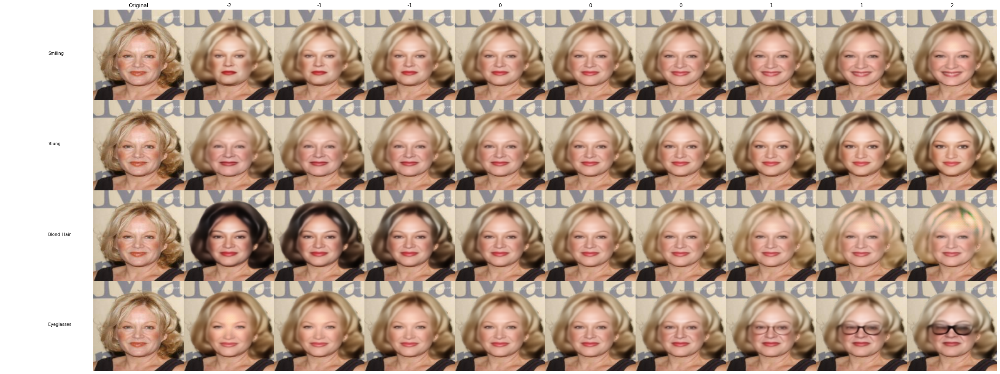

In [ ]:
im = ut.load_img('/content/ManipulateFacialAttributesUsingVAE/cache/samples/155794.jpg')

sample_attrs = ['Smiling', 'Young', 'Blond_Hair', 'Eyeglasses']

preds = []
for vec_at in [vec_female_smiling, vec_female_young, vec_female_blond, vec_female_eyeglass]:
  X_pred, attr_factor = vae_add.predict_spectrum(im[None] / 255, vec_at[None], boundaries=(-2, 2), nsamples=9)
  preds.append(X_pred)


ncol = len(X_pred) + 2
nrow = len(preds)
fig, axs = plt.subplots(nrow, ncol, figsize=(3 * ncol, nrow * 3))
plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
[a.set_axis_off() for ax in axs for a in ax]

for i, X_pred in enumerate(preds):
  axs[i, 0].text(x=.5, y=.5, s=10, text=sample_attrs[i])
  axs[i, 1].imshow(im)
  if i == 0:
    axs[i, 1].set_title('Original')
  
  for a, p, f in zip(axs[i, 2:], X_pred, attr_factor):
      a.imshow(p[0])
      if i == 0:
        a.set_title(int(f))

### Beard example

In [ ]:
beard_bnames = ['162303.jpg', '169145.jpg', '011945.jpg']
beard_paths = list(map(cat.mount_path, beard_bnames))
beard_ims = np.stack(list(map(ut.load_img, beard_paths))) / 255

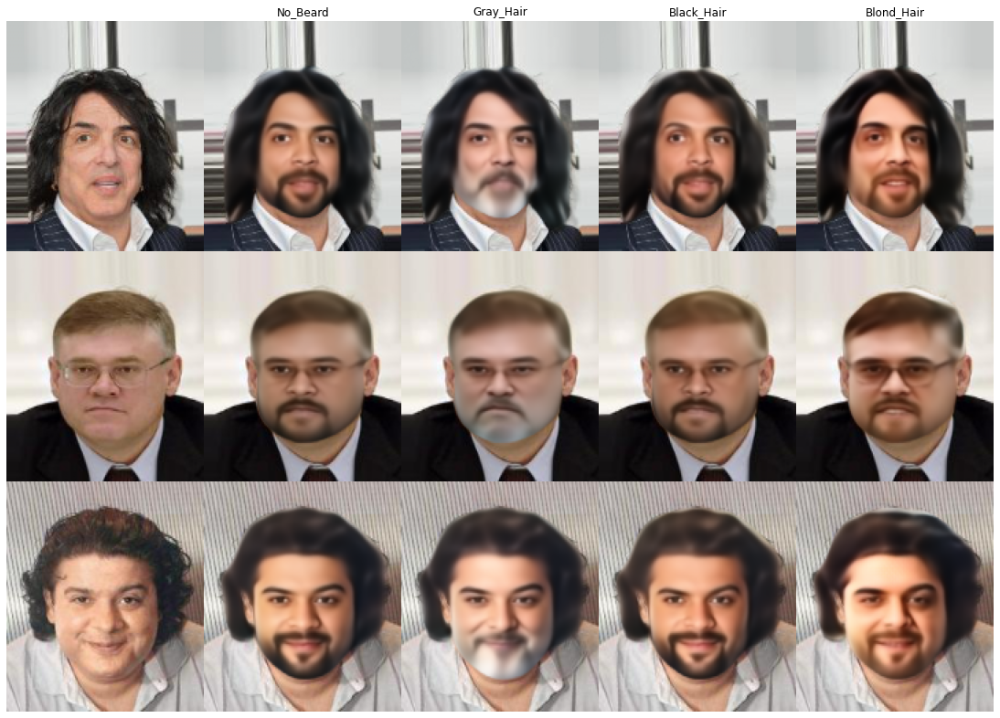

In [ ]:
beard_atts = ['No_Beard', 'Gray_Hair', 'Black_Hair', 'Blond_Hair']
vector_atbeard = {k:v for k, v in zip(beard_atts, [vec_male_nobeard, vec_male_nobeard_gray, vec_male_nobeard_black, vec_male_nobeard_blond])}

test_samples = {'in_image': beard_ims}
test_preds = {}
for at, scale in zip(beard_atts, (4.5, 4.5, 4.5, 6)):
  vt = - scale * vector_atbeard[at]
  test_samples['in_attr'] = np.stack([vt for _ in range(len(beard_ims))])
  test_preds[at] = vae_add.predict(test_samples)


ncols = len(beard_atts) + 1
nrow = len(beard_ims)
fig, axs = plt.subplots(nrow, ncols, figsize=(ncols * 3, nrow * 3.5))
[a.set_axis_off() for ax in axs for a in ax]
plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)

for i, im in enumerate(beard_ims):
  axs[i, 0].imshow(im, aspect='auto')

for j, at in enumerate(beard_atts, 1):
  axs[0, j].set_title(beard_atts[j - 1])

for j, at_pred in enumerate(test_preds.values(), 1):
  for i, im in enumerate(at_pred[0]):
    axs[i, j].imshow(im, aspect='auto')

### Women other attributes

In [ ]:
others_bnames = ['067199.jpg', '121005.jpg', '071221.jpg']
others_paths = list(map(cat.mount_path, others_bnames))
others_ims = np.stack(list(map(ut.load_img, others_paths))) / 255

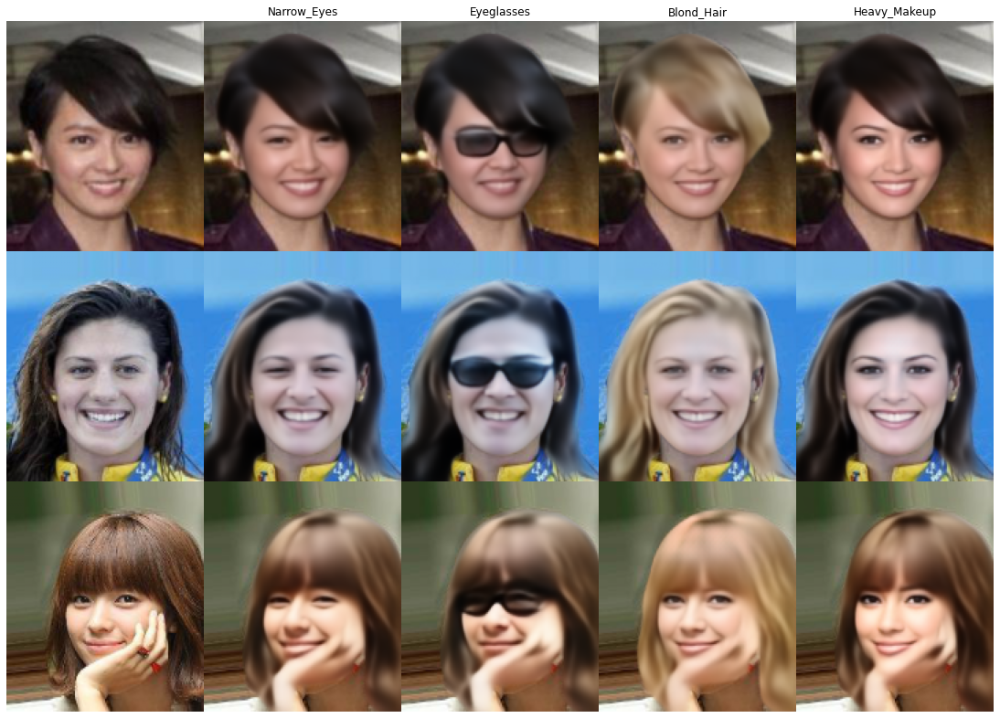

In [ ]:
others_atts = ['Narrow_Eyes', 'Eyeglasses', 'Blond_Hair', 'Heavy_Makeup']
vector_atothers = {k:v for k, v in zip(others_atts, [vec_female_narroweyes, vec_female_eyeglass, vec_female_blond, vec_female_makeup])}

test_samples = {'in_image': others_ims}
test_preds = {}
for at, scale in zip(others_atts, (1.9, 2.0, 2.0, 2.0)):
  vt = scale * vector_atothers[at]
  test_samples['in_attr'] = np.stack([vt for _ in range(len(others_ims))])
  test_preds[at] = vae_add.predict(test_samples)

ncols = len(test_preds) + 1
nrow = len(others_ims)
fig, axs = plt.subplots(nrow, ncols, figsize=(ncols * 3, nrow * 3.5))
[a.set_axis_off() for ax in axs for a in ax]
plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)

for i, im in enumerate(others_ims):
  axs[i, 0].imshow(im, aspect='auto')

for j, at in enumerate(others_atts, 1):
  axs[0, j].set_title(others_atts[j - 1])

for j, at_pred in enumerate(test_preds.values(), 1):
  for i, im in enumerate(at_pred[0]):
    axs[i, j].imshow(im, aspect='auto')

# Cache

README examples

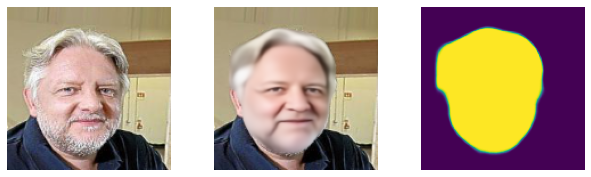

In [ ]:
impath = os.path.join(os.environ['celeba'], 'imgs/077771.jpg')
im = ut.load_img(impath)
p = vae.predict(im[None] / 255)
p = [p[0][0], p[1][0, ..., 0]]

fig, axs = plt.subplots(1, 3, figsize=(3 * 3.5, 3))
[a.set_axis_off() for a in axs]


for a, x in zip(axs, (im, *p)):
  a.imshow(x)

fig.savefig('/content/drive/MyDrive/out_077771.png', bbox_inches='tight')

In [ ]:
pspectrum, _ = vae_add.predict_spectrum(im[None] / 255, vec_attrs['Smiling'][None], boundaries=(-1.5, 1.5), nsamples=6)

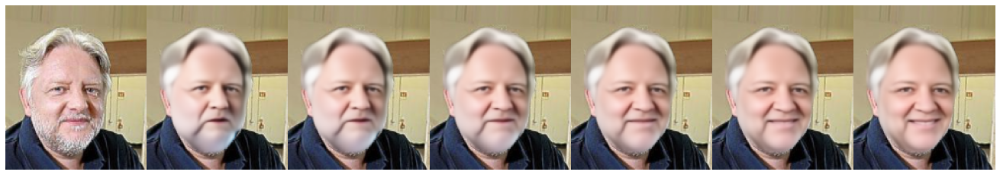

In [ ]:
fig, axs = plt.subplots(1, len(pspectrum) + 1, figsize=(18, 3))
[a.set_axis_off() for a in axs]
plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)

for a, x in zip(axs, (im[None], *pspectrum)):
  a.imshow(x[0], aspect='auto')

fig.savefig('/content/drive/MyDrive/out_077771_spectrum.png', bbox_inches='tight')